## Skin Cancer Detection Using CNN

##### Done By

Name: **Arunkumar Gunasekaran**

Batch: **ML C57**  Assignment: **Melanoma Detection Assignment**

Email: manigunasekaran30@gmail.com

# Melanoma Detection Assignment

## Table of Contents
1. [Problem Statement](#Problem-statement)
2. [Importing Necessary Modules](#Importing-all-the-important-libraries)
3. [Data Understanding](#Data-Understanding)
4. [Create a dataset](#Create-a-dataset)
5. [Visualize the data](#Visualize-the-data)
6. [Create the model](#Create-the-model)
    - [Simple Model](#Simple-Model)
    - [Model With Dropouts](#Model-With-Dropouts)
    - [Model With Increased Feature Maps](#Model-With-Increased-Feature-Maps)
    - [Model with Additional Layers](#Model-with-Additional-Layers)
7. [Data Augmentation](#Data-Augmentation)
     - [Using Preprocessing Data Augmentation Layer](#Using-Preprocessing-Data-Augmentation-Layer)
     - [Using ImageDataGenerator](#Using-ImageDataGenerator)
8. [Handling Class Imbalance](#Handling-Class-Imbalance)
     - [Ploting Class Distriubution](#Ploting-Class-Distriubution)
     - [Generating images with Augmentor](#Generating-images-with-Augmentor)
     - [Model building on updated Augmentor data](#Model-building-on-updated-Augmentor-data)
9. [Conclusion](#Conclusion)


## Problem statement





 To build a CNN based model which can accurately detect melanoma. Melanoma is a type of cancer that can be deadly if not detected early. It accounts for 75% of skin cancer deaths. A solution which can evaluate images and alert the dermatologists about the presence of melanoma has the potential to reduce a lot of manual effort needed in diagnosis.

### Importing Skin Cancer Data

### Importing all the important libraries

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from collections import Counter

import zipfile
import os
import PIL
import pathlib
#from google.colab import drive
from glob import glob

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator

## Data Understanding

In [2]:
#using google drive for mounting the data
#uncomment gdrive path if loading data from the gdrive
#drive.mount('/content/gdrive')

##Ref:https://towardsdatascience.com/downloading-datasets-into-google-drive-via-google-colab-bcb1b30b0166

In [3]:
#unziping test and train dataset
#!unzip /content/gdrive/MyDrive/UpgradAssignments/DL/Melanoma_detection/CNN_assignment.zip -d /content/gdrive/MyDrive/UpgradAssignments/DL/Melanoma_detection

#unzip logic for local windows system
relative_zip_path = 'CNN_assignment.zip'
relative_extract_to_directory = 'CNN_assignment'

current_directory = os.getcwd()
absolute_zip_path = os.path.join(current_directory, relative_zip_path)
absolute_extract_to_directory = os.path.join(current_directory, relative_extract_to_directory)

with zipfile.ZipFile(absolute_zip_path, 'r') as zip_ref:
    zip_ref.extractall(absolute_extract_to_directory)


In [4]:
#renaming folder to avoid lengthy names on path
#uncomment if loading data from the gdrive
#os.rename("/content/gdrive/MyDrive/UpgradAssignments/DL/Melanoma_detection/Skin cancer ISIC The International Skin Imaging Collaboration",
          #os.path.join(os.path.dirname("/content/gdrive/MyDrive/UpgradAssignments/DL/Melanoma_detection/Skin cancer ISIC The International Skin Imaging Collaboration"), "dataset"))

#rename logic for local windows system
os.rename("CNN_assignment\Skin cancer ISIC The International Skin Imaging Collaboration", "CNN_assignment\dataset")

In [5]:
# Defining the path for train and test images

#uncomment gdrive path if loading data from the gdrive
#train_dataset_path = "/content/gdrive/MyDrive/UpgradAssignments/DL/Melanoma_detection/dataset/Train"
#test_dataset_path ="/content/gdrive/MyDrive/UpgradAssignments/DL/Melanoma_detection/dataset/Test"

#filepath for local system
train_dataset_path = "CNN_assignment\dataset\Train"
test_dataset_path ="CNN_assignment\dataset\Test"

data_dir_train = pathlib.Path(train_dataset_path)
data_dir_test = pathlib.Path(test_dataset_path)

In [6]:
image_count_train = len(list(data_dir_train.glob('*/*.jpg')))
print(image_count_train)
image_count_test = len(list(data_dir_test.glob('*/*.jpg')))
print(image_count_test)

2239
118


This assignment uses a dataset of about 2357 images of skin cancer types. The dataset contains 9 sub-directories in each train and test subdirectories. The 9 sub-directories contains the images of 9 skin cancer types respectively.

1. 2239 images are in Training Dataset
2. 118 images are in Testing Dataset

### Load using keras.preprocessing

Let's load these images off disk using the helpful image_dataset_from_directory utility.

### Create a dataset

Defining some parameters for the loader:

In [7]:
batch_size = 32
img_height = 180
img_width = 180

Use 80% of the images for training, and 20% for validation.

In [8]:
## creating function to split train and test
## Using seed=123 while creating your dataset using tf.keras.preprocessing.image_dataset_from_directory
## making sure to resize images to the size img_height*img_width, while writting the dataset

def split_train_test(subsetName):
    return tf.keras.preprocessing.image_dataset_from_directory(
               data_dir_train,
               seed=123,
               validation_split=0.2,
               subset=subsetName,
               image_size=(img_height,img_width),
               batch_size=batch_size)

In [9]:
#creating training dataset
train_ds = split_train_test("training")

Found 2239 files belonging to 9 classes.
Using 1792 files for training.


In [10]:
#creating validation dataset
val_ds = split_train_test("validation")

Found 2239 files belonging to 9 classes.
Using 447 files for validation.


In [11]:
# Listing out all the classes of skin cancer and store them in a list.
# We can find the class names in the class_names attribute on these datasets.
# These correspond to the directory names in alphabetical order.
class_names = train_ds.class_names
print(class_names)

['actinic keratosis', 'basal cell carcinoma', 'dermatofibroma', 'melanoma', 'nevus', 'pigmented benign keratosis', 'seborrheic keratosis', 'squamous cell carcinoma', 'vascular lesion']


In [12]:
#checking count of images for each Class
counter = Counter()
for images,labels in train_ds:
   counter.update(labels.numpy())

for label,count in counter.items():
    print(f"Class: {class_names[label]}, Count: {count}")

Class: vascular lesion, Count: 115
Class: nevus, Count: 277
Class: pigmented benign keratosis, Count: 370
Class: melanoma, Count: 352
Class: dermatofibroma, Count: 77
Class: actinic keratosis, Count: 92
Class: basal cell carcinoma, Count: 309
Class: squamous cell carcinoma, Count: 142
Class: seborrheic keratosis, Count: 58


### Visualize the data
#### let's visualize one instance of all the nine classes present in the dataset

In [13]:
#Taking one batch of training dataset and exploring
for images, labels in train_ds.take(1):
   print(images.shape)
   print(labels.shape)
   print(labels)

(32, 180, 180, 3)
(32,)
tf.Tensor([5 1 8 4 5 1 4 5 3 5 5 8 3 3 8 5 1 6 5 8 3 3 1 1 4 1 2 4 4 1 4 1], shape=(32,), dtype=int32)


one batch contains 32 images with size 180 *180 with three RGB channels
each images having associated 32 labels we can see it tensor as 0 to 8

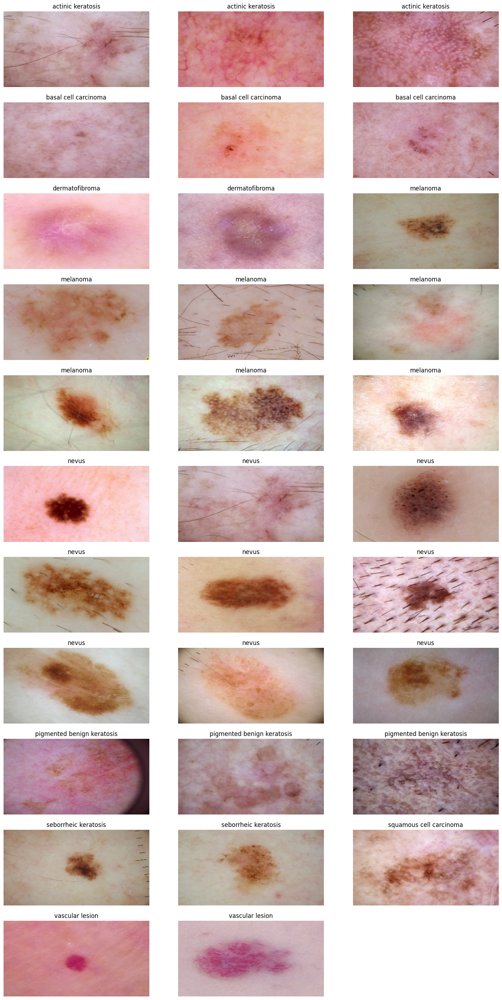

In [14]:
# defining function to plot images and labels
def plot_images_labels(images,labels):
   plt.figure(figsize=(18,36))
   img_dict_by_class = {}
   #creating dictnory of images by class names
   for i in range(len(images)):
     class_label = class_names[labels[i]]
     if class_label in img_dict_by_class:
        img_dict_by_class[class_label].append(images[i].numpy().astype("uint8"))
     else:
        img_dict_by_class[class_label] = []
        img_dict_by_class[class_label].append(images[i].numpy().astype("uint8"))

   counter=1
   img_dict_by_class_ordered = {key:img_dict_by_class[key] for key in sorted(img_dict_by_class.keys())}
   #sorting by class names so we can visualize same class image side by side
   for key,value in img_dict_by_class_ordered.items():
     for img_ind in range(len(value)):
        plt.subplot(11,3,counter)
        plt.imshow(value[img_ind],aspect="auto")
        plt.title(key)
        plt.axis("off")
        counter= counter+1
   plt.show()
#plotting image of each class present in one batch
for images, labels in train_ds.take(1):
   plot_images_labels(images, labels)



The `image_batch` is a tensor of the shape `(32, 180, 180, 3)`. This is a batch of 32 images of shape `180x180x3` (the last dimension refers to color channels RGB). The `label_batch` is a tensor of the shape `(32,)`, these are corresponding labels to the 32 images.

`Dataset.cache()` keeps the images in memory after they're loaded off disk during the first epoch.

`Dataset.prefetch()` overlaps data preprocessing and model execution while training.

In [15]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

## Create the model
### Simple Model
We can create a CNN model, which can accurately detect 9 classes present in the dataset. Using ```layers.experimental.preprocessing.Rescaling``` to normalize pixel values between (0,1). The RGB channel values are in the `[0, 255]` range. This is not ideal for a neural network. Here, it is good to standardize values to be in the `[0, 1]`

#### Model Building

In [16]:
## Model Building
num_classes =9
model = Sequential([
    layers.experimental.preprocessing.Rescaling(1./255,input_shape=(img_height,img_width,3)),
    layers.Conv2D(16,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128,activation='relu'),
    layers.Dense(num_classes,activation='softmax')
])

#### Compile the model
Choosing an Adam optimiser and SparseCategoricalCrossentropy loss function for model training

In [17]:
### compiling model after specifying optimizer and loss fucntions
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [18]:
# View the summary of all layers
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 180, 180, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 90, 90, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 45, 45, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 45, 45, 64)        1

#### Train the model

In [19]:
epochs = 20
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20


D:\DevFiles\programFiles\anaconda3\envs\tf\lib\site-packages\keras\backend.py:5582: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


56/56 [==============================] - 17s 63ms/step - loss: 1.9043 - accuracy: 0.3114 - val_loss: 1.7021 - val_accuracy: 0.4072
Epoch 2/20
56/56 [==============================] - 2s 30ms/step - loss: 1.6307 - accuracy: 0.4252 - val_loss: 1.4984 - val_accuracy: 0.4899
Epoch 3/20
56/56 [==============================] - 2s 28ms/step - loss: 1.4535 - accuracy: 0.4972 - val_loss: 1.3952 - val_accuracy: 0.5257
Epoch 4/20
56/56 [==============================] - 2s 29ms/step - loss: 1.3783 - accuracy: 0.5067 - val_loss: 1.2914 - val_accuracy: 0.5615
Epoch 5/20
56/56 [==============================] - 2s 28ms/step - loss: 1.2246 - accuracy: 0.5731 - val_loss: 1.3621 - val_accuracy: 0.5459
Epoch 6/20
56/56 [==============================] - 2s 28ms/step - loss: 1.1874 - accuracy: 0.5837 - val_loss: 1.5205 - val_accuracy: 0.4899
Epoch 7/20
56/56 [==============================] - 2s 39ms/step - loss: 1.1117 - accuracy: 0.5965 - val_loss: 1.3389 - val_accuracy: 0.5459
Epoch 8/20
56/56 [=====

#### Visualizing training results

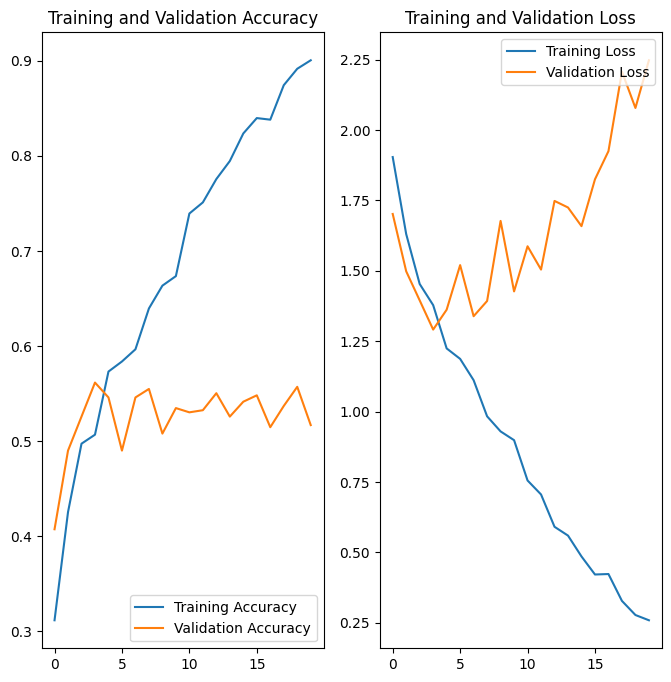

In [20]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

#### Findings
1. Model performs well on the traing dataset but fails perform validation data set
2. The model is overfitting the train dataset instead of learning and generalizing the pattern
3. We can use some Dropouts and batch Normalization to overcome the overfitting

### Model With Dropouts

In [21]:

num_classes =9
model = Sequential([
    layers.experimental.preprocessing.Rescaling(1./255,input_shape=(img_height,img_width,3)),
    layers.Conv2D(16,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64,3,padding='same',activation='relu'),
    layers.BatchNormalization(),# adding BN as regularizing technique
    layers.MaxPooling2D(),
    layers.Dropout(0.25),# adding Dropout as regularizing technique
    layers.Flatten(),
    layers.Dense(128,activation='relu'),
    layers.Dropout(0.3), # adding Dropout as regularizing technique
    layers.Dense(num_classes,activation='softmax')
])

In [22]:

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [23]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 90, 90, 16)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 45, 45, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 45, 45, 64)       

In [24]:
epochs = 20
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20
56/56 [==============================] - 2s 33ms/step - loss: 1.9533 - accuracy: 0.3555 - val_loss: 2.1236 - val_accuracy: 0.1611
Epoch 2/20
56/56 [==============================] - 2s 30ms/step - loss: 1.5025 - accuracy: 0.4732 - val_loss: 1.9907 - val_accuracy: 0.2819
Epoch 3/20
56/56 [==============================] - 2s 30ms/step - loss: 1.3727 - accuracy: 0.5084 - val_loss: 2.0452 - val_accuracy: 0.2528
Epoch 4/20
56/56 [==============================] - 2s 30ms/step - loss: 1.2550 - accuracy: 0.5619 - val_loss: 2.0103 - val_accuracy: 0.3132
Epoch 5/20
56/56 [==============================] - 2s 30ms/step - loss: 1.1478 - accuracy: 0.5926 - val_loss: 1.9112 - val_accuracy: 0.3177
Epoch 6/20
56/56 [==============================] - 2s 30ms/step - loss: 1.0639 - accuracy: 0.6250 - val_loss: 1.6335 - val_accuracy: 0.4519
Epoch 7/20
56/56 [==============================] - 2s 30ms/step - loss: 0.9469 - accuracy: 0.6607 - val_loss: 1.5298 - val_accuracy: 0.4877
Epoch 8/20
56

#### Findings
    1. using drop out and BN doesn't improve the gap between Training and validation accuracy
    2. We can try another experiement of adding more feature maps
  

### Model With Increased Feature Maps

In [25]:
### Increased feature maps
num_classes =9
model = Sequential([
    layers.experimental.preprocessing.Rescaling(1./255,input_shape=(img_height,img_width,3)),
    layers.Conv2D(64,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(128,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(256,activation='relu'),
    layers.Dense(num_classes,activation='softmax')
])

In [26]:

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [27]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_2 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 180, 180, 64)      1792      
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 90, 90, 64)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 90, 90, 64)        36928     
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 45, 45, 64)       0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 45, 45, 128)      

In [28]:
epochs = 20
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20
56/56 [==============================] - 6s 80ms/step - loss: 2.1933 - accuracy: 0.2494 - val_loss: 1.8191 - val_accuracy: 0.3020
Epoch 2/20
56/56 [==============================] - 4s 70ms/step - loss: 1.7995 - accuracy: 0.3421 - val_loss: 1.7476 - val_accuracy: 0.4027
Epoch 3/20
56/56 [==============================] - 4s 69ms/step - loss: 1.6142 - accuracy: 0.4129 - val_loss: 1.4916 - val_accuracy: 0.4787
Epoch 4/20
56/56 [==============================] - 4s 69ms/step - loss: 1.4291 - accuracy: 0.5073 - val_loss: 1.4011 - val_accuracy: 0.5347
Epoch 5/20
56/56 [==============================] - 4s 69ms/step - loss: 1.3548 - accuracy: 0.5162 - val_loss: 1.3974 - val_accuracy: 0.4899
Epoch 6/20
56/56 [==============================] - 4s 70ms/step - loss: 1.2604 - accuracy: 0.5469 - val_loss: 1.5308 - val_accuracy: 0.4720
Epoch 7/20
56/56 [==============================] - 4s 70ms/step - loss: 1.1755 - accuracy: 0.5787 - val_loss: 1.4492 - val_accuracy: 0.5101
Epoch 8/20
56

#### Findings
1. There is only marginal improvement compared to previous
2. We can put features map back to previous as it will help interms of computation efficiency

### Model with Additional Layers

In [29]:
num_classes =9
model = Sequential([
    layers.experimental.preprocessing.Rescaling(1./255,input_shape=(img_height,img_width,3)),
    layers.Conv2D(16,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(128,3,padding='same',activation='relu'),#additional Layer
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128,activation='relu'),
    layers.Dense(num_classes,activation='softmax')
])

In [30]:

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [31]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_3 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_9 (Conv2D)           (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 90, 90, 16)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 45, 45, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 45, 45, 64)       

In [32]:
epochs = 20
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20
56/56 [==============================] - 3s 33ms/step - loss: 2.0228 - accuracy: 0.2327 - val_loss: 1.8723 - val_accuracy: 0.3132
Epoch 2/20
56/56 [==============================] - 2s 30ms/step - loss: 1.7812 - accuracy: 0.3504 - val_loss: 1.6477 - val_accuracy: 0.4430
Epoch 3/20
56/56 [==============================] - 2s 30ms/step - loss: 1.6601 - accuracy: 0.4208 - val_loss: 1.6325 - val_accuracy: 0.4452
Epoch 4/20
56/56 [==============================] - 2s 31ms/step - loss: 1.5362 - accuracy: 0.4615 - val_loss: 1.6799 - val_accuracy: 0.4430
Epoch 5/20
56/56 [==============================] - 2s 31ms/step - loss: 1.4740 - accuracy: 0.4860 - val_loss: 1.5001 - val_accuracy: 0.5011
Epoch 6/20
56/56 [==============================] - 2s 30ms/step - loss: 1.3482 - accuracy: 0.5357 - val_loss: 1.4183 - val_accuracy: 0.5190
Epoch 7/20
56/56 [==============================] - 2s 30ms/step - loss: 1.2822 - accuracy: 0.5519 - val_loss: 1.4852 - val_accuracy: 0.4832
Epoch 8/20
56

#### findings
   1. Adding an Additional layer does help reduce the gap between training and validation But there is not much improvement at the validation Accuracy
   2. As the multiple experiments didn't improve the validation accuracy it might related to the input data itself, As in real-time scenarios images can be taken in different positions and scales.
   3. We can apply the data augmentation techniques and see the improvement in accuracy

## Data Augmentation

### Using Preprocessing Data Augmentation Layer

In [33]:

data_augmentation_layer = keras.Sequential([
  layers.experimental.preprocessing.RandomFlip('horizontal'),
  layers.experimental.preprocessing.RandomRotation(0.1),
  layers.experimental.preprocessing.RandomZoom(0.1),
  layers.experimental.preprocessing.RandomTranslation(1,.5,fill_mode="reflect",interpolation="bilinear",seed=None,fill_value=0.0),
  layers.experimental.preprocessing.RandomContrast(0.1)])

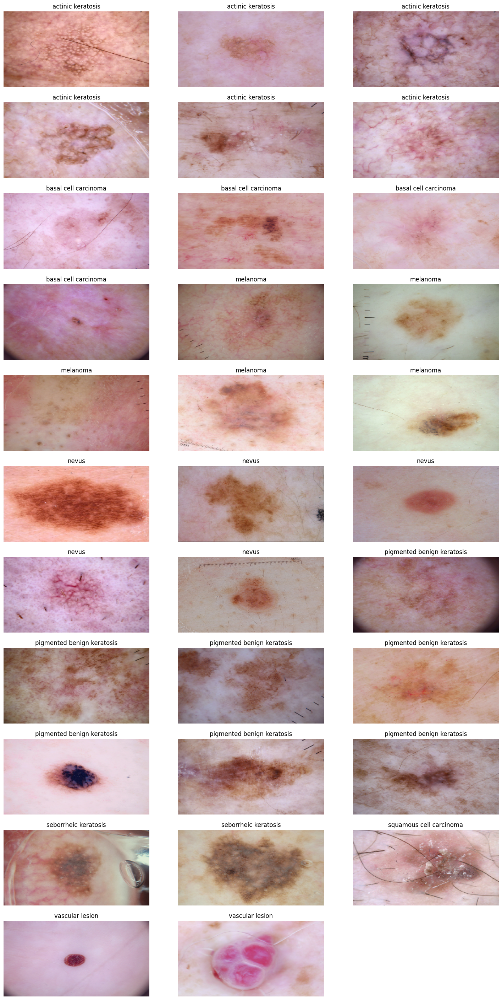

In [34]:
#visualizing how augmentation strategy works for one instance of training image.

for images, labels in train_ds.take(1):
   plot_images_labels(data_augmentation_layer(images), labels)

#### Building Model


In [35]:

num_classes =9
model = Sequential([
    data_augmentation_layer,
    layers.experimental.preprocessing.Rescaling(1./255,input_shape=(img_height,img_width,3)),
    layers.Conv2D(16,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128,activation='relu'),
    layers.Dropout(0.25),
    layers.Dense(num_classes,activation='softmax')
])

#### Compiling the model

In [36]:

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

#### Training the model

In [37]:
epochs = 20
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20
56/56 [==============================] - 49s 696ms/step - loss: 2.0683 - accuracy: 0.2333 - val_loss: 1.8130 - val_accuracy: 0.3043
Epoch 2/20
56/56 [==============================] - 38s 682ms/step - loss: 1.8739 - accuracy: 0.3097 - val_loss: 1.9306 - val_accuracy: 0.2819
Epoch 3/20
56/56 [==============================] - 38s 680ms/step - loss: 1.7775 - accuracy: 0.3454 - val_loss: 1.7091 - val_accuracy: 0.3579
Epoch 4/20
56/56 [==============================] - 38s 681ms/step - loss: 1.7199 - accuracy: 0.3566 - val_loss: 1.7072 - val_accuracy: 0.3624
Epoch 5/20
56/56 [==============================] - 38s 674ms/step - loss: 1.6709 - accuracy: 0.3532 - val_loss: 1.6515 - val_accuracy: 0.3893
Epoch 6/20
56/56 [==============================] - 38s 671ms/step - loss: 1.6546 - accuracy: 0.3811 - val_loss: 1.6656 - val_accuracy: 0.3893
Epoch 7/20
56/56 [==============================] - 38s 683ms/step - loss: 1.6944 - accuracy: 0.3694 - val_loss: 1.6374 - val_accuracy: 0.3870

#### Visualizing the results

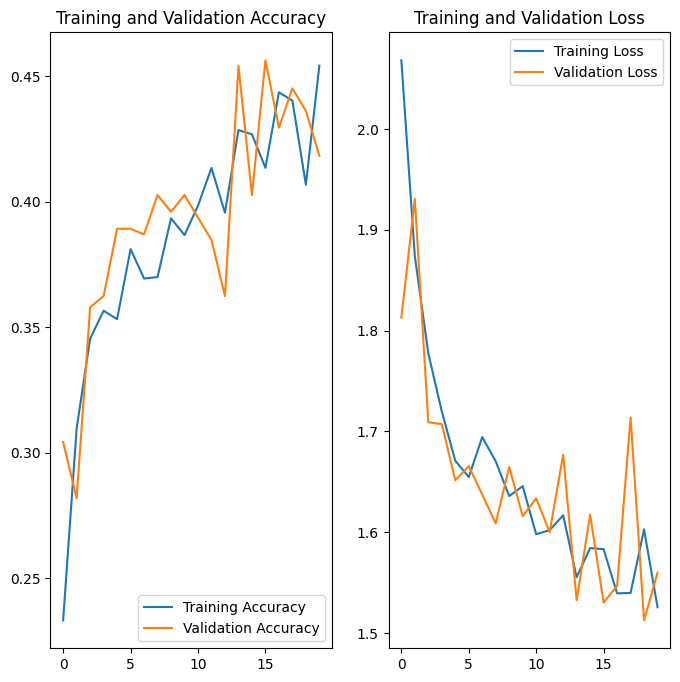

In [38]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

#### Findings
 1. There is not an huge cap between training accuracy and validation accuracy
 2. But the model is underfitting
 3. Let's another augmentaion streategy with Image Data generator

### Using ImageDataGenerator

In [39]:
#generating test and train dataset using ImageDataGenerator
batch_size=100
train_data_generator = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    rescale=1./255,
    validation_split=0.2)

train_data_generated = train_data_generator.flow_from_directory(
    batch_size=batch_size,
    directory=train_dataset_path,
    shuffle=True,
    target_size=(img_height,img_width),
    class_mode='sparse',subset="training")
validation_data_generated = train_data_generator.flow_from_directory(
    batch_size=batch_size,
    directory=train_dataset_path,
    shuffle=True,
    target_size=(img_height,img_width),
    class_mode='sparse',subset="validation")

test_data_generator = ImageDataGenerator(rescale=1./255)
test_data_generated = test_data_generator.flow_from_directory(
    batch_size=batch_size,
    directory=test_dataset_path,
    target_size=(img_height, img_width),
    class_mode='sparse')

Found 1795 images belonging to 9 classes.
Found 444 images belonging to 9 classes.
Found 118 images belonging to 9 classes.


In [40]:
## Building model on newly generated dataset

num_classes =9
model = Sequential([
    layers.Conv2D(16,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128,activation='relu'),
    layers.Dense(num_classes,activation='softmax')
])
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
epochs = 20
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20
56/56 [==============================] - 2s 30ms/step - loss: 35.5405 - accuracy: 0.2227 - val_loss: 1.9602 - val_accuracy: 0.2864
Epoch 2/20
56/56 [==============================] - 2s 28ms/step - loss: 1.8485 - accuracy: 0.3516 - val_loss: 1.8028 - val_accuracy: 0.4318
Epoch 3/20
56/56 [==============================] - 2s 28ms/step - loss: 1.7255 - accuracy: 0.3940 - val_loss: 3.7579 - val_accuracy: 0.2483
Epoch 4/20
56/56 [==============================] - 2s 28ms/step - loss: 1.8855 - accuracy: 0.3142 - val_loss: 1.8413 - val_accuracy: 0.3154
Epoch 5/20
56/56 [==============================] - 2s 28ms/step - loss: 1.6186 - accuracy: 0.4448 - val_loss: 1.9442 - val_accuracy: 0.3468
Epoch 6/20
56/56 [==============================] - 2s 28ms/step - loss: 1.4682 - accuracy: 0.4766 - val_loss: 1.7240 - val_accuracy: 0.4183
Epoch 7/20
56/56 [==============================] - 2s 28ms/step - loss: 1.4199 - accuracy: 0.4933 - val_loss: 2.0126 - val_accuracy: 0.4094
Epoch 8/20
5

#### Findings
 1. Model is not performing better with Data Augmentaion it is underfitting
 2. We can verify the class imbalance and handle class imbalance to improve model performance

### Handling Class Imbalance


#### **Context:** Many times real life datasets can have class imbalance, one class can have proportionately higher number of samples compared to the others. Class imbalance can have a detrimental effect on the final model quality. Hence as a sanity check it becomes important to check what is the distribution of classes in the data.

#### Ploting Class Distriubution

Class: melanoma, Count: 352
Class: dermatofibroma, Count: 77
Class: pigmented benign keratosis, Count: 370
Class: vascular lesion, Count: 115
Class: nevus, Count: 277
Class: actinic keratosis, Count: 92
Class: squamous cell carcinoma, Count: 142
Class: basal cell carcinoma, Count: 309
Class: seborrheic keratosis, Count: 58


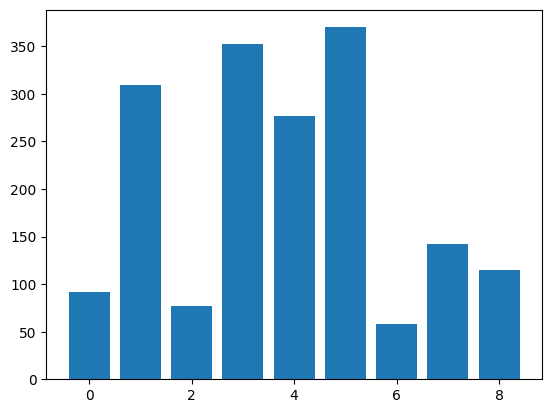

In [41]:

counter = Counter()
for images,labels in train_ds:
   counter.update(labels.numpy())

for label,count in counter.items():
    print(f"Class: {class_names[label]}, Count: {count}")

plt.bar(counter.keys(),counter.values())
plt.show()

In [42]:
# puting the number of images for each class into dataframe
path_list = [x for x in glob(os.path.join(data_dir_train, '*', '*.jpg'))]
lesion_list = [os.path.basename(os.path.dirname(y)) for y in glob(os.path.join(data_dir_train, '*', '*.jpg'))]
len(path_list)

2239

In [43]:
dataframe_dict_original = dict(zip(path_list, lesion_list))
original_df = pd.DataFrame(list(dataframe_dict_original.items()),columns = ['Path','Label'])
original_df.head()

,Path,Label
0,CNN_assignment\dataset\Train\actinic keratosis...,actinic keratosis
1,CNN_assignment\dataset\Train\actinic keratosis...,actinic keratosis
2,CNN_assignment\dataset\Train\actinic keratosis...,actinic keratosis
3,CNN_assignment\dataset\Train\actinic keratosis...,actinic keratosis
4,CNN_assignment\dataset\Train\actinic keratosis...,actinic keratosis


#### Findings
#### seborrheic keratosis, dermatofibrom, actinic keratosis has least samples
#### pigmented benign keratosis, Melanoma has more samples


### Generating images with Augmentor

#### **Context:** we can use a python package known as `Augmentor` (https://augmentor.readthedocs.io/en/master/) to add more samples across all classes so that none of the classes have very few samples.

In [44]:
!pip install Augmentor

To use `Augmentor`, the following general procedure is followed:

1. Instantiate a `Pipeline` object pointing to a directory containing your initial image data set.<br>
2. Define a number of operations to perform on this data set using your `Pipeline` object.<br>
3. Execute these operations by calling the `Pipeline’s` `sample()` method.


In [45]:
path_to_training_dataset=train_dataset_path+"/"
import Augmentor
for i in class_names:
    print(path_to_training_dataset+i)
    p = Augmentor.Pipeline(path_to_training_dataset + i)
    p.rotate(probability=0.7, max_left_rotation=10, max_right_rotation=10)
    p.sample(500) ## We are adding 500 samples per class to make sure that none of the classes are sparse.

CNN_assignment\dataset\Train/actinic keratosis
Initialised with 114 image(s) found.
Output directory set to CNN_assignment\dataset\Train/actinic keratosis\output.

Processing <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=600x450 at 0x1B982DFD7F0>: 100%|██████████| 500/500 [00:03<00:00, 140.54 Samples/s]


CNN_assignment\dataset\Train/basal cell carcinoma
Initialised with 376 image(s) found.
Output directory set to CNN_assignment\dataset\Train/basal cell carcinoma\output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x1B9828EC250>: 100%|██████████| 500/500 [00:03<00:00, 141.42 Samples/s]                  


CNN_assignment\dataset\Train/dermatofibroma
Initialised with 95 image(s) found.
Output directory set to CNN_assignment\dataset\Train/dermatofibroma\output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x1B982DC97C0>: 100%|██████████| 500/500 [00:03<00:00, 139.48 Samples/s]                  


CNN_assignment\dataset\Train/melanoma
Initialised with 438 image(s) found.
Output directory set to CNN_assignment\dataset\Train/melanoma\output.

Processing <PIL.Image.Image image mode=RGB size=1024x768 at 0x1B9829054F0>: 100%|██████████| 500/500 [00:20<00:00, 24.97 Samples/s]                   


CNN_assignment\dataset\Train/nevus
Initialised with 357 image(s) found.
Output directory set to CNN_assignment\dataset\Train/nevus\output.

Processing <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=767x576 at 0x1B9828774F0>: 100%|██████████| 500/500 [00:17<00:00, 28.21 Samples/s]  


CNN_assignment\dataset\Train/pigmented benign keratosis
Initialised with 462 image(s) found.
Output directory set to CNN_assignment\dataset\Train/pigmented benign keratosis\output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x1B9828E81C0>: 100%|██████████| 500/500 [00:03<00:00, 145.01 Samples/s]                  


CNN_assignment\dataset\Train/seborrheic keratosis
Initialised with 77 image(s) found.
Output directory set to CNN_assignment\dataset\Train/seborrheic keratosis\output.

Processing <PIL.Image.Image image mode=RGB size=1024x768 at 0x1B83BC72CD0>: 100%|██████████| 500/500 [00:07<00:00, 63.47 Samples/s]                  


CNN_assignment\dataset\Train/squamous cell carcinoma
Initialised with 181 image(s) found.
Output directory set to CNN_assignment\dataset\Train/squamous cell carcinoma\output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x1B84C9EDD00>: 100%|██████████| 500/500 [00:03<00:00, 126.87 Samples/s]                  


CNN_assignment\dataset\Train/vascular lesion
Initialised with 139 image(s) found.
Output directory set to CNN_assignment\dataset\Train/vascular lesion\output.

Processing <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=600x450 at 0x1B982E0F310>: 100%|██████████| 500/500 [00:03<00:00, 130.82 Samples/s]


Augmentor has stored the augmented images in the output sub-directory of each of the sub-directories of skin cancer types.. Lets take a look at total count of augmented images.

In [46]:
image_count_train = len(list(data_dir_train.glob('*/output/*.jpg')))
print(image_count_train)

4500


### Lets see the distribution of augmented data after adding new images to the original training data.

In [47]:

path_list_new = [x for x in glob(os.path.join(data_dir_train, '*','output', '*.jpg'))]
path_list_new

['CNN_assignment\\dataset\\Train\\actinic keratosis\\output\\actinic keratosis_original_ISIC_0025780.jpg_3d85e3aa-dcf7-463b-8cb3-f69c81ca0051.jpg',
 'CNN_assignment\\dataset\\Train\\actinic keratosis\\output\\actinic keratosis_original_ISIC_0025780.jpg_8ab633a1-e24c-43dd-b20b-86c9149ef02f.jpg',
 'CNN_assignment\\dataset\\Train\\actinic keratosis\\output\\actinic keratosis_original_ISIC_0025780.jpg_e365a864-14aa-4bea-9939-5b6ac95620e9.jpg',
 'CNN_assignment\\dataset\\Train\\actinic keratosis\\output\\actinic keratosis_original_ISIC_0025780.jpg_e514afdd-1cdd-49c7-82f7-4991e28582ef.jpg',
 'CNN_assignment\\dataset\\Train\\actinic keratosis\\output\\actinic keratosis_original_ISIC_0025803.jpg_a5d775ff-a17d-4fe7-8c58-c87396f387c6.jpg',
 'CNN_assignment\\dataset\\Train\\actinic keratosis\\output\\actinic keratosis_original_ISIC_0025825.jpg_8ff520ee-2d00-42d7-83dd-f32d13d571d6.jpg',
 'CNN_assignment\\dataset\\Train\\actinic keratosis\\output\\actinic keratosis_original_ISIC_0025953.jpg_088ca2e

In [48]:
lesion_list_new = [os.path.basename(os.path.dirname(os.path.dirname(y))) for y in glob(os.path.join(data_dir_train, '*','output', '*.jpg'))]
lesion_list_new

['actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic keratosis',
 'actinic 

In [49]:
dataframe_dict_new = dict(zip(path_list_new, lesion_list_new))

In [50]:
#combining original images and newly generated images to see the total count
df2 = pd.DataFrame(list(dataframe_dict_new.items()),columns = ['Path','Label'])
new_df = pd.concat([original_df, df2])

In [51]:
new_df['Label'].value_counts()

Label
pigmented benign keratosis    962
melanoma                      938
basal cell carcinoma          876
nevus                         857
squamous cell carcinoma       681
vascular lesion               639
actinic keratosis             614
dermatofibroma                595
seborrheic keratosis          577
Name: count, dtype: int64

So, now we have added 500 images to all the classes to maintain some class balance. We can add more images as we want to improve training process.

### Model building on updated Augmentor data

In [52]:
batch_size = 32
img_height = 180
img_width = 180

#### Creating  training dataset

In [53]:
data_dir_train=train_dataset_path
train_ds = split_train_test("training")

Found 6739 files belonging to 9 classes.
Using 5392 files for training.


#### Creating  validation dataset

In [54]:
val_ds = split_train_test("validation")

Found 6739 files belonging to 9 classes.
Using 1347 files for validation.


#### Building  model

In [64]:

num_classes=9
model = Sequential([
    layers.experimental.preprocessing.Rescaling(1./255),
    layers.Conv2D(16,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(128,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Dropout(0.3),
    layers.Flatten(),
    layers.Dense(128,activation='relu'),
    layers.Dropout(0.25),
    layers.Dense(num_classes,activation='softmax')
])

#### Compile  model

In [65]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [66]:
epochs = 30
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/30
169/169 [==============================] - 11s 56ms/step - loss: 1.9950 - accuracy: 0.2418 - val_loss: 1.6085 - val_accuracy: 0.4120
Epoch 2/30
169/169 [==============================] - 10s 57ms/step - loss: 1.5822 - accuracy: 0.4045 - val_loss: 1.4152 - val_accuracy: 0.4551
Epoch 3/30
169/169 [==============================] - 10s 59ms/step - loss: 1.4076 - accuracy: 0.4596 - val_loss: 1.2766 - val_accuracy: 0.5189
Epoch 4/30
169/169 [==============================] - 11s 60ms/step - loss: 1.3174 - accuracy: 0.5015 - val_loss: 1.2039 - val_accuracy: 0.5442
Epoch 5/30
169/169 [==============================] - 11s 61ms/step - loss: 1.2462 - accuracy: 0.5202 - val_loss: 1.2096 - val_accuracy: 0.5197
Epoch 6/30
169/169 [==============================] - 11s 62ms/step - loss: 1.1835 - accuracy: 0.5536 - val_loss: 1.1114 - val_accuracy: 0.5716
Epoch 7/30
169/169 [==============================] - 11s 64ms/step - loss: 1.0524 - accuracy: 0.6072 - val_loss: 1.1145 - val_accuracy:

#### Visualize the model results

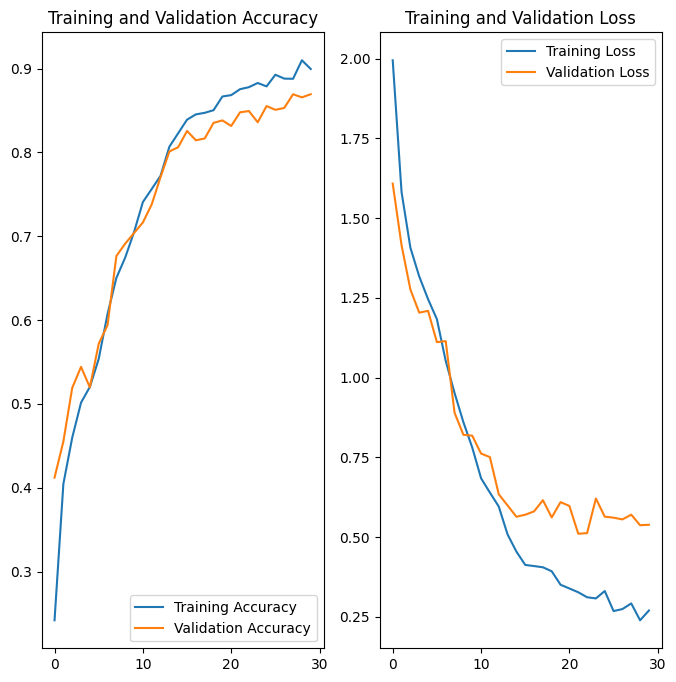

In [67]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

#### Findings
 1. Class Imbalance is helping to resolve the overfitting and underfitting
 2. Now there is only 2% gap between training accurancy and validation accuracy



## Model Prediction on Test Data


In [68]:
class_names

['actinic keratosis',
 'basal cell carcinoma',
 'dermatofibroma',
 'melanoma',
 'nevus',
 'pigmented benign keratosis',
 'seborrheic keratosis',
 'squamous cell carcinoma',
 'vascular lesion']

1/1 [==============================] - 0s 89ms/step
Actual Class melanoma
Predictive Class melanoma


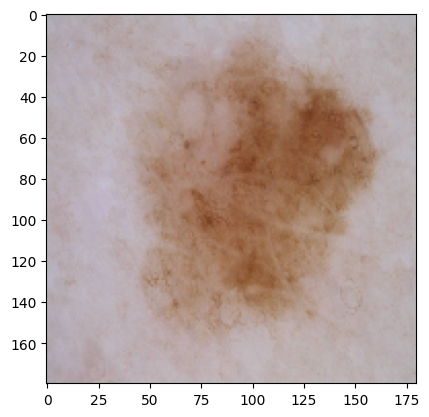

In [69]:
from tensorflow.keras.preprocessing.image import load_img

def test_prediction_by_class(i):
    test_img_path = os.path.join(data_dir_test, class_names[i], '*')
    test_images = glob(test_img_path)
    test_img = load_img(test_images[-1],target_size=(180,180,3))
    plt.imshow(test_img)
    plt.grid(False)
    
    img = np.expand_dims(test_img,axis=0)
    pred = model.predict(img)
    pred = np.argmax(pred)
    predicted_class = class_names[pred]
    print("Actual Class "+ class_names[i] +'\n'+ "Predictive Class "+predicted_class )

# testing the classification of malanoma
test_prediction_by_class(3)

1/1 [==============================] - 0s 28ms/step
Actual Class nevus
Predictive Class nevus


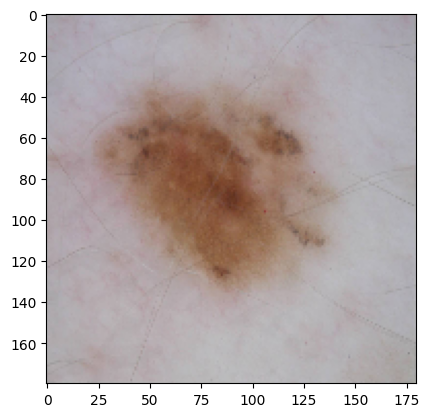

In [70]:
#testing non melanoma classification
test_prediction_by_class(4)

1/1 [==============================] - 0s 20ms/step
Actual Class basal cell carcinoma
Predictive Class basal cell carcinoma


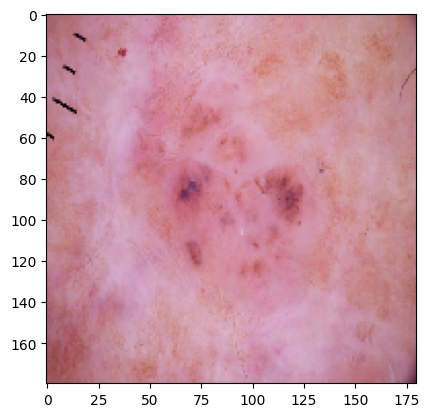

In [74]:
#testing non melanoma classification
test_prediction_by_class(1)

1/1 [==============================] - 0s 21ms/step
Actual Class vascular lesion
Predictive Class vascular lesion


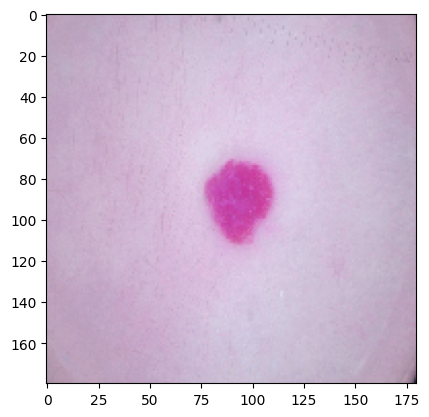

In [75]:
#testing non melanoma classification
test_prediction_by_class(8)

1/1 [==============================] - 0s 22ms/step
Actual Class pigmented benign keratosis
Predictive Class pigmented benign keratosis


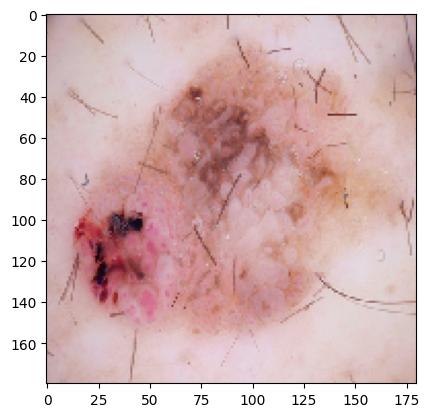

In [77]:
#testing non melanoma classification
test_prediction_by_class(5)

## Conclusion

#### Created CNN Model different combinations and listed observations below
 1. created a simple model and observed the training accuracy of 90% and validation accuracy of 51%
 2. it is observed that the model is overfitting and tried to resolve with dropouts
 3. the model with dropout had a training accuracy of 89% and a validation accuracy of 50%
 4. created another model with more feature maps which resulted in  a training accuracy of 87% and validation accuracy of 51%
 5. created another model with one more layer which resulted in  a training accuracy of 84% and validation accuracy of 52%
 6. All the above experiments failed to resolve the overfitting of the model, so started experimenting with data augmentation
 7. Created a model with a data augmentation layer using the TensorFlow preprocessing library which resulted in  a training accuracy of 45% and validation accuracy of 41%. Which is actually underfitting the model
 8. Tried different Data Augmentation strategies with ImageDataGenerator, the model resulted in  a training accuracy of 72% and validation accuracy of 42%. Which is still an underfitting model
 9. Verified the dataset for class imbalance and found that actually seborrheic keratosis, dermatofibrom, actinic keratosis has least samples and pigmented benign keratosis, Melanoma has more sample
10. handling the class imbalance by adding 500 samples to each of them using an augmentor 
11. Created a new model on the updated dataset with dropouts, so we can close the gap between training and validation accuracy and achieved  a training accuracy of 89% and validation accuracy of 87%
12. Using the above model verify the predictions on some random images
